*CONTENTS*: This script includes some more plots generated during the revision process, including the Somite scoring and Palantir trajectory analysis 

In [1]:
!conda info --envs

# conda environments:
#
base                     C:\Users\aleja\anaconda3
CommonOperations         C:\Users\aleja\anaconda3\envs\CommonOperations
Palantir_Env1         *  C:\Users\aleja\anaconda3\envs\Palantir_Env1
scRNA_env                C:\Users\aleja\anaconda3\envs\scRNA_env
scvelo_env               C:\Users\aleja\anaconda3\envs\scvelo_env
singlecellEnv            C:\Users\aleja\anaconda3\envs\singlecellEnv
textenv                  C:\Users\aleja\anaconda3\envs\textenv



In [2]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import palantir

In [3]:
sc.settings.verbosity = 3             
sc.logging.print_versions()  
sc.settings.set_figure_params(dpi=80, facecolor='white')

C:\Users\aleja\anaconda3\envs\Palantir_Env1\lib\site-packages\session_info\main.py:213: UserWarning: The '__version__' attribute is deprecated and will be removed in MarkupSafe 3.1. Use feature detection, or `importlib.metadata.version("markupsafe")`, instead.
  mod_version = _find_version(mod.__version__)


-----
anndata     0.10.7
scanpy      1.10.0
-----
PIL                         11.3.0
anyio                       NA
arrow                       1.3.0
asttokens                   NA
attr                        25.3.0
attrs                       25.3.0
babel                       2.17.0
brotli                      1.0.9
certifi                     2025.08.03
charset_normalizer          3.4.3
colorama                    0.4.6
comm                        0.2.3
cycler                      0.12.1
cython_runtime              NA
dateutil                    2.9.0.post0
debugpy                     1.8.16
decorator                   5.2.1
defusedxml                  0.7.1
exceptiongroup              1.3.0
executing                   2.2.0
fastjsonschema              NA
fqdn                        NA
h5py                        3.14.0
idna                        3.11
igraph                      0.11.4
importlib_resources         NA
ipykernel                   6.30.1
isoduration                 NA


In [4]:
WT_adata = sc.read_h5ad('D:/BIOINFO/POURQUIE/HOX_project/Analysis_SCANPY/H5AD/20241113_WT_qc_filtered_dr_clustered_ano.h5ad')
HOXKO_adata = sc.read_h5ad('D:/BIOINFO/POURQUIE/HOX_project/Analysis_SCANPY/H5AD/20241113_HOXKO_qc_filtered_dr_clustered_ano.h5ad')

In [5]:
print(WT_adata.X.shape) #log norm counts (all genes)
print(WT_adata.raw.X.shape)  #log norm counts
print(WT_adata.raw.X[:10,:10])

print(HOXKO_adata.X.shape) #log norm counts (all genes)
print(HOXKO_adata.raw.X.shape)  #log norm counts
print(HOXKO_adata.raw.X[:10,:10])

(5564, 27500)
(5564, 27500)
  (4, 5)	0.5358017683029175
  (8, 5)	1.177945852279663
  (5, 6)	0.46809160709381104
(4124, 27222)
(4124, 27222)
  (2, 1)	0.42701777815818787
  (0, 4)	0.3486010730266571
  (5, 4)	0.6657679080963135
  (8, 4)	0.44470882415771484
  (3, 5)	0.6416028738021851
  (6, 6)	0.5139382481575012


### Prep the data 
We fuse the somitic clusters into one for downstream analysis

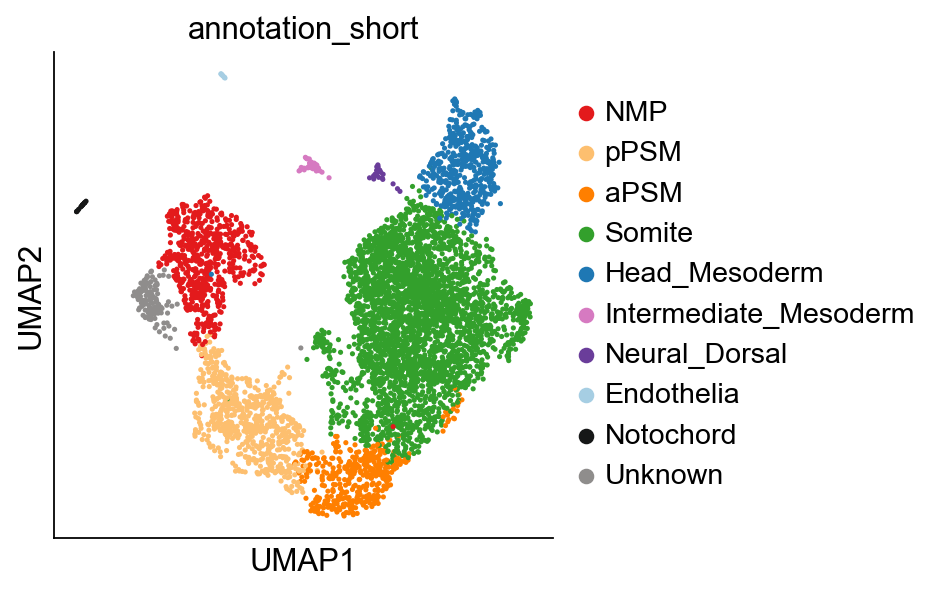

In [6]:
WT_adata_fused= WT_adata.copy()

WT_adata_fused.obs['annotation_short'] = (
    WT_adata_fused.obs["annotation"]
    .map(lambda x: {"Somite_1": "Somite", "Somite_2": "Somite", "Somite_3": "Somite"}.get(x, x))
    .astype("category")
)

WT_adata_fused.obs['annotation_short'] = WT_adata_fused.obs['annotation_short'].cat.reorder_categories(['NMP','pPSM','aPSM','Somite',
                     'Head_Mesoderm','Intermediate_Mesoderm','Neural_Dorsal','Endothelia','Notochord', 'Unknown' ])
custom_colors = [
    '#e31a1c', '#fdbf6f', '#ff7f00', '#33a02c',
    '#1f78b4', '#d67ac1', '#6a3d9a', 
    '#a6cee3', '#161717', '#8f8d8c'  
]

WT_adata_fused.uns["annotation_short_colors"] = custom_colors

sc.pl.umap(WT_adata_fused, color="annotation_short", save="20260805_WT_UMAP_fusedSomite.pdf")

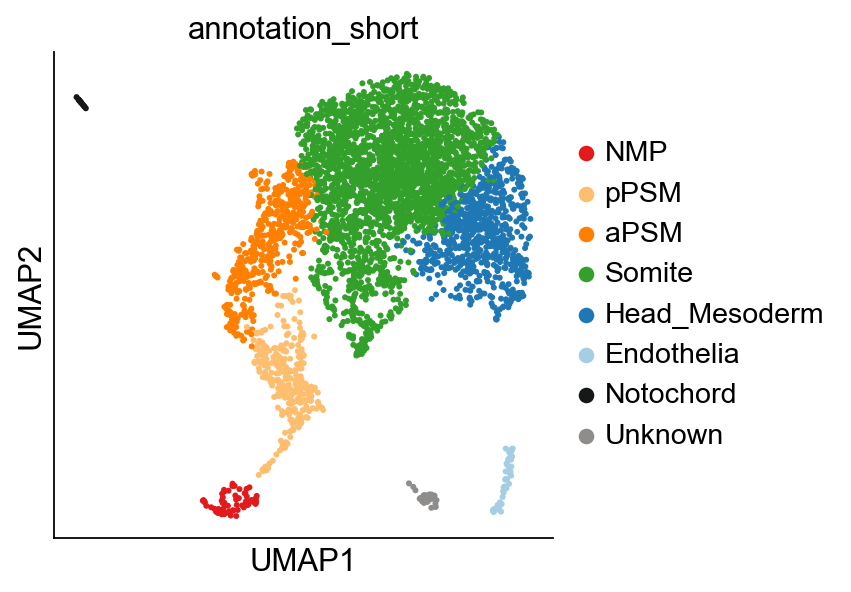

In [7]:
HOXKO_adata_fused= HOXKO_adata.copy()

HOXKO_adata_fused.obs['annotation_short'] = (
    HOXKO_adata_fused.obs["annotation"]
    .map(lambda x: {"Somite_1": "Somite", "Somite_2": "Somite"}.get(x, x))
    .astype("category")
)

HOXKO_adata_fused.obs['annotation_short'] = HOXKO_adata_fused.obs['annotation_short'].cat.reorder_categories(['NMP','pPSM','aPSM','Somite',
                     'Head_Mesoderm','Endothelia','Notochord', 'Unknown' ])

custom_colors2 = [
    '#e31a1c', '#fdbf6f', '#ff7f00',
    '#33a02c','#1f78b4', 
    '#a6cee3', '#161717', '#8f8d8c'  
]

HOXKO_adata_fused.uns["annotation_short_colors"] = custom_colors2
sc.pl.umap(HOXKO_adata_fused, color="annotation_short", save="20260805_HOXKO_UMAP_fusedSomite.pdf")

## PART 1 - SCORING SOMITE IDENTITY

In [8]:
somite_genes = [
    "MEOX2",        
    "PAX3",           
    "TCF15", 
    "EYA2",
    "SIX1",
    "FOXD1",
    "UNCX",  
    "EPHB2" ,   
]

This is just to show how they are expressed on the WT somite clusters:

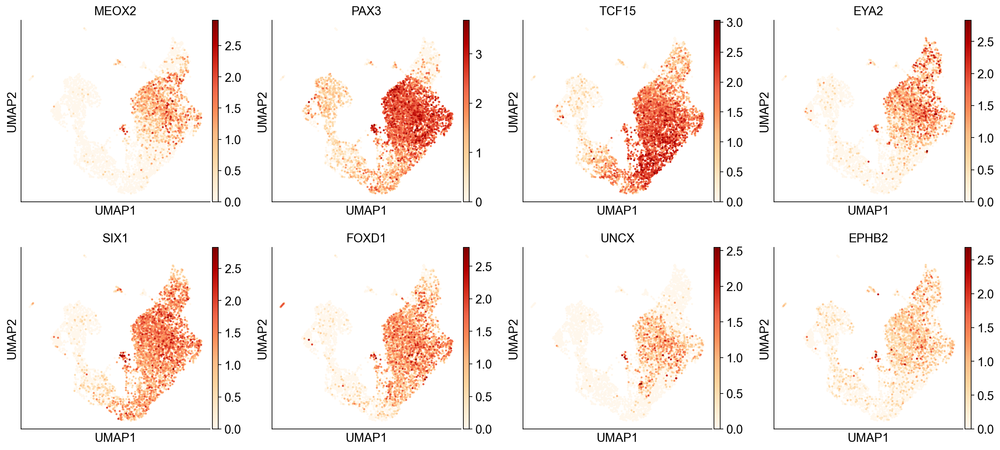

In [9]:
sc.pl.umap(
    WT_adata,
    color=somite_genes,
    ncols=4,
    color_map="OrRd",
)

Let´s compute a score based on the expression of the somite marker genes

In [10]:
score_name = "Somite_identity_score"
sc.tl.score_genes(
    WT_adata_fused,
    gene_list=somite_genes,
    score_name=score_name,
    use_raw=False,
)
sc.tl.score_genes(
    HOXKO_adata_fused,
    gene_list=somite_genes,
    score_name=score_name,
    use_raw=False,
)
 

computing score 'Somite_identity_score'
    finished: added
    'Somite_identity_score', score of gene set (adata.obs).
    300 total control genes are used. (0:00:00)
computing score 'Somite_identity_score'
    finished: added
    'Somite_identity_score', score of gene set (adata.obs).
    300 total control genes are used. (0:00:00)


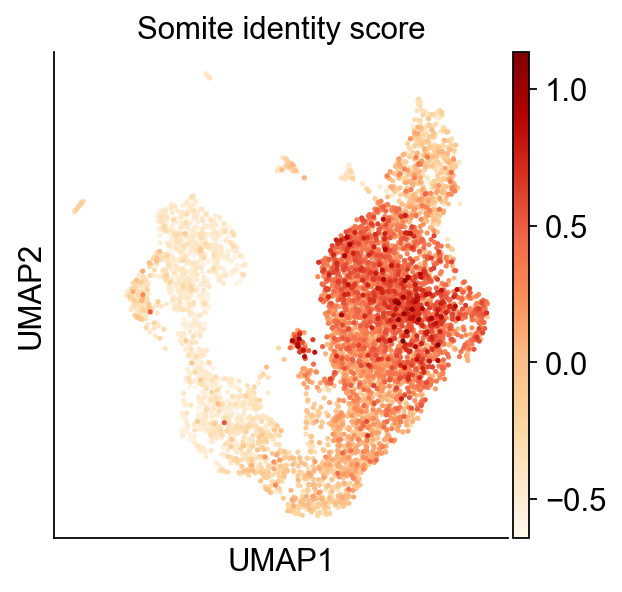

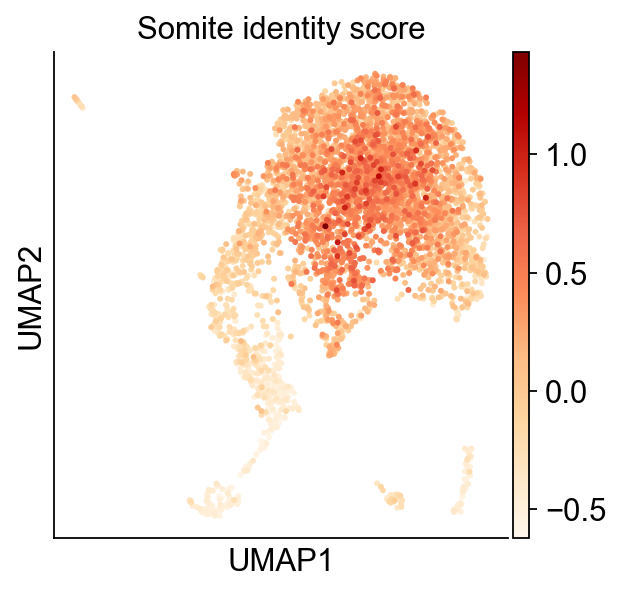

In [11]:
sc.pl.umap(
    WT_adata_fused,
    color="Somite_identity_score",
    color_map="OrRd",
    title="Somite identity score",
    save="20260805_WT_SomiteScoring_UMAP.pdf"
)

sc.pl.umap(
    HOXKO_adata_fused,
    color="Somite_identity_score",
    color_map="OrRd",
    title="Somite identity score",
    save="20260805_HOXKO_SomiteScoring_UMAP.pdf"
)

Let´s subset the data for both WT and HOXKO datasets

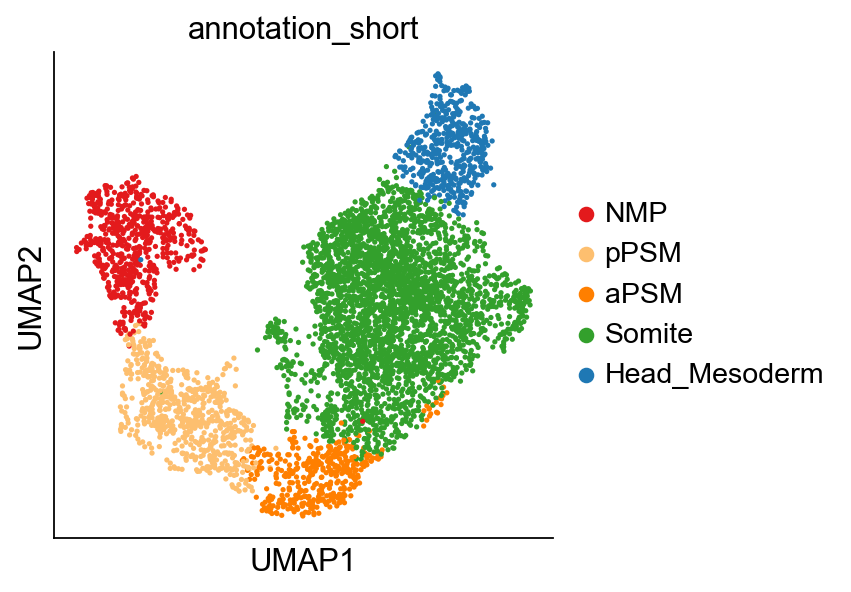

In [12]:
WT_adata_subset = WT_adata_fused[WT_adata_fused.obs['annotation_short'].isin(['NMP','pPSM','aPSM','Somite', 'Head_Mesoderm'])].copy()
sc.pl.umap(WT_adata_subset, color="annotation_short")

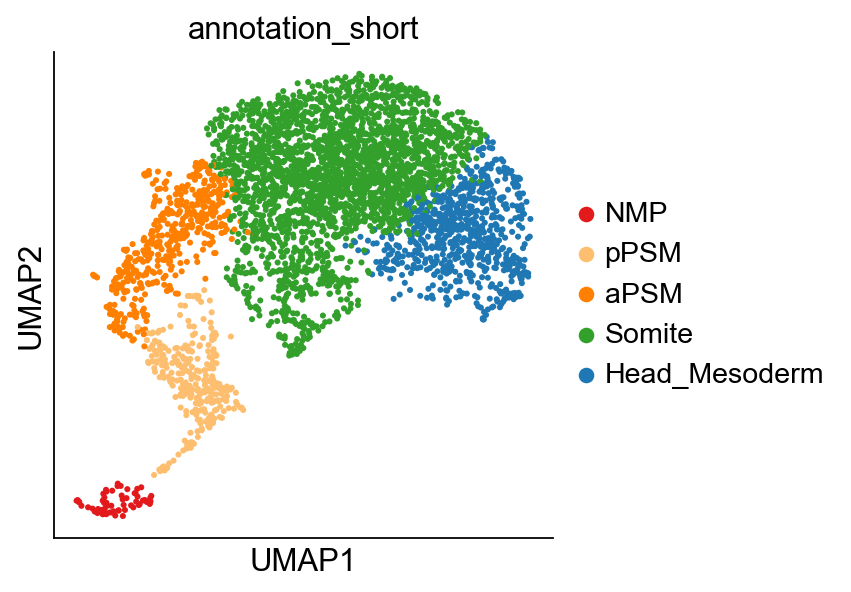

In [13]:
HOXKO_adata_subset = HOXKO_adata_fused[HOXKO_adata_fused.obs['annotation_short'].isin(['NMP', 'pPSM','aPSM','Somite','Head_Mesoderm'])].copy()
sc.pl.umap(HOXKO_adata_subset, color="annotation_short")

Let´s generate a violin plot to show the somite score per cluster

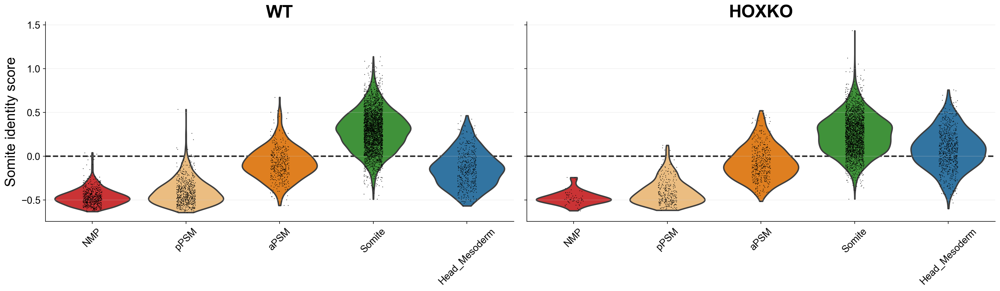

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(20, 6), sharey=True)

sc.pl.violin(
    WT_adata_subset,
    score_name,
    groupby="annotation_short",
    rotation=45,
    ax=axes[0],
    show=False,
    linewidth=2,
)
axes[0].set_title("WT", fontsize=25, fontweight="bold")

sc.pl.violin(
    HOXKO_adata_subset,
    score_name,
    groupby="annotation_short",
    rotation=45,
    ax=axes[1],
    show=False,
    linewidth=2,
)
axes[1].set_title("HOXKO", fontsize=25, fontweight="bold")

for ax in axes:
    ax.axhline(0, color="black", linestyle="--", linewidth=2, zorder=0)
    ax.set_xlabel("")
    ax.set_ylabel("Somite identity score" if ax is axes[0] else "", fontsize=20)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.grid(axis="y", alpha=0.3)

plt.tight_layout()
fig.savefig("figures/20260805_WTandHOXKO_somite_identity_score_violin.pdf", format="pdf", bbox_inches="tight")
plt.show()

## PART 2 - RUN PALANTIR

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
HVGs found in subset: 4085
computing PCA
    with n_comps=50
    finished (0:00:02)


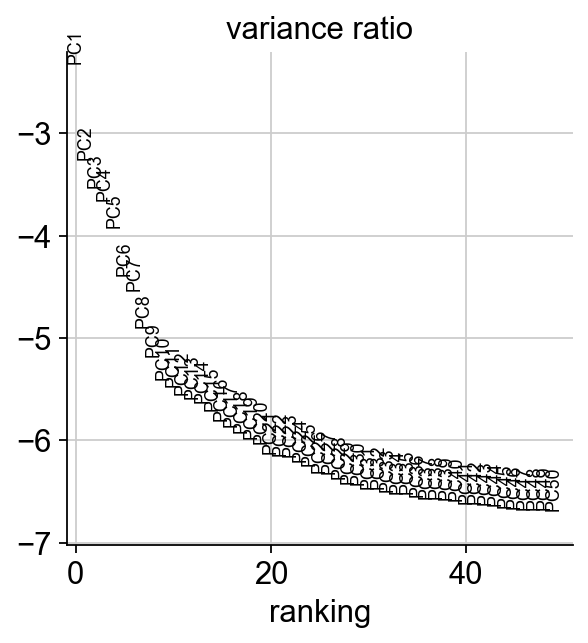

computing neighbors


C:\Users\aleja\anaconda3\envs\Palantir_Env1\lib\site-packages\threadpoolctl.py:1226: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)
C:\Users\aleja\anaconda3\envs\Palantir_Env1\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:10)


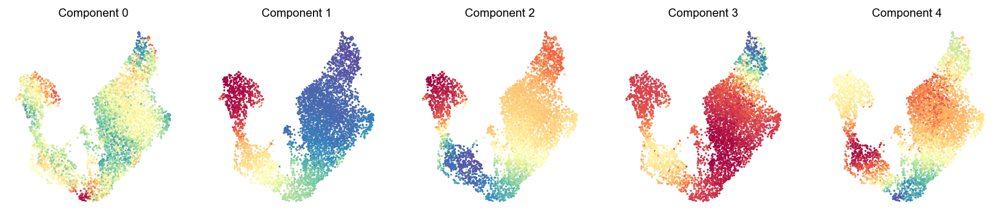

Selected early cell (recomputed PCA): CAGTTCCGTAACTAAG-1
Sampling and flocking waypoints...
Time for determining waypoints: 0.0039000709851582846 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.18968570232391357 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


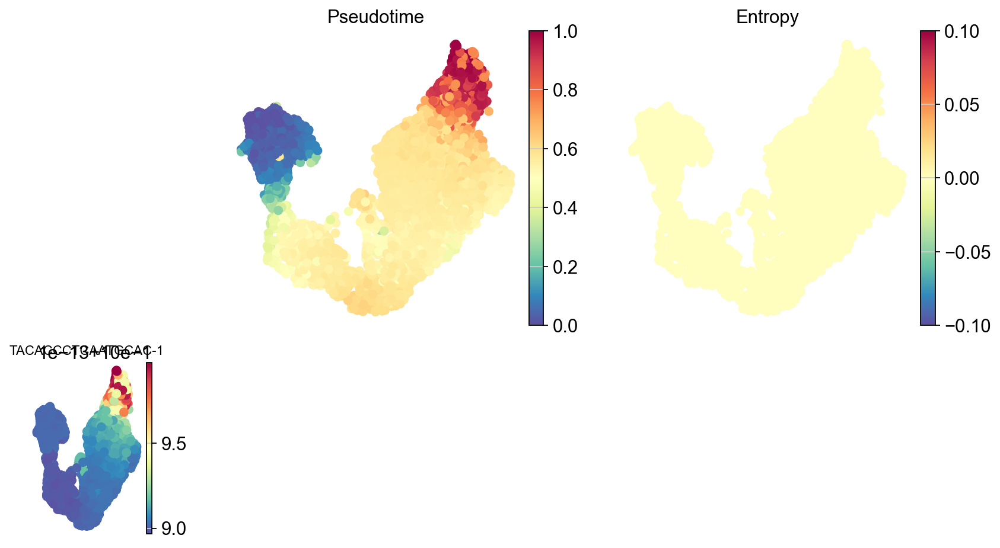

['TACACCCTCAATGCAC-1']
TACACCCTCAATGCAC-1    Head_Mesoderm
Name: annotation_short, dtype: category
Categories (5, object): ['NMP', 'pPSM', 'aPSM', 'Somite', 'Head_Mesoderm']


<Figure size 800x400 with 0 Axes>

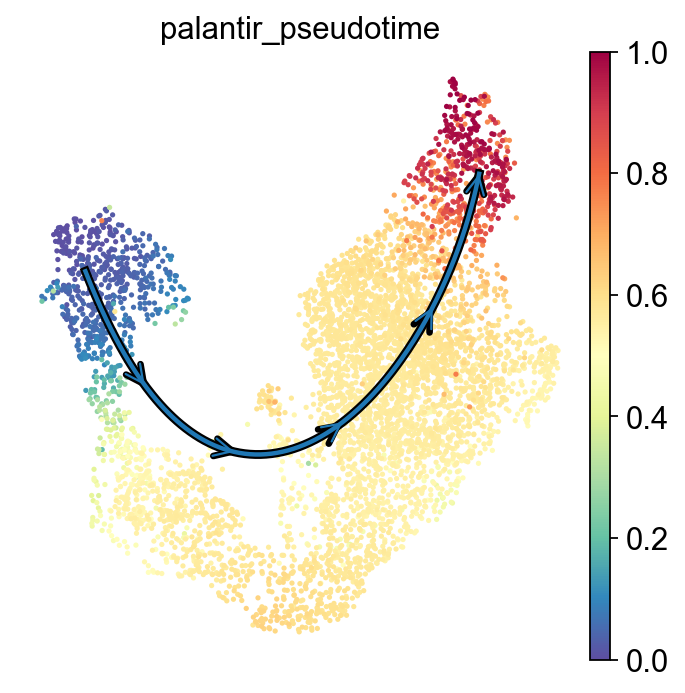

In [15]:
WT_adata_subset_recomp = WT_adata_subset.copy()

# recompute HVGs within just this lineage
sc.pp.highly_variable_genes(WT_adata_subset_recomp, min_mean=0.0125, max_mean=3, min_disp=0.5)
print(f"HVGs found in subset: {WT_adata_subset_recomp.var['highly_variable'].sum()}")

# fresh PCA restricted to this lineage only
sc.tl.pca(WT_adata_subset_recomp, svd_solver='arpack')
sc.pl.pca_variance_ratio(WT_adata_subset_recomp, log=True, n_pcs=50)

# Diffusion maps on the recomputed PCA
n_diffusion_components = 5
WT_dm_res_recomp = palantir.utils.run_diffusion_maps(WT_adata_subset_recomp, n_components=n_diffusion_components)
WT_ms_data_recomp = palantir.utils.determine_multiscale_space(WT_adata_subset_recomp)

palantir.plot.plot_diffusion_components(WT_adata_subset_recomp)
plt.show()

# Derive early_cell based on the co-expression of SOX2 and TBXT in NMPs
nmp_mask_recomp = WT_adata_subset_recomp.obs["annotation_short"] == "NMP"
nmp_subset_recomp = WT_adata_subset_recomp.raw.to_adata()[nmp_mask_recomp]

sox2_expr_recomp = nmp_subset_recomp[:, "SOX2"].X.toarray().flatten()
tbxt_expr_recomp = nmp_subset_recomp[:, "TBXT"].X.toarray().flatten()
coexpr_score_recomp = sox2_expr_recomp * tbxt_expr_recomp

early_cell_recomp = nmp_subset_recomp.obs_names[np.argmax(coexpr_score_recomp)]
print(f"Selected early cell (recomputed PCA): {early_cell_recomp}")

# Run Palantir
pr_res_recomp = palantir.core.run_palantir(
    WT_adata_subset_recomp,
    early_cell=early_cell_recomp,
    num_waypoints=500,
)

palantir.plot.plot_palantir_results(WT_adata_subset_recomp)
plt.show()

# Terminal state check
terminal_cells_recomp = pr_res_recomp.branch_probs.columns.tolist()
print(terminal_cells_recomp)
print(WT_adata_subset_recomp.obs.loc[terminal_cells_recomp, 'annotation_short'])

# Violin plot — pseudotime by cluster

sc.pl.violin(
    WT_adata_subset_recomp,
    "palantir_pseudotime",
    groupby="annotation_short",
    rotation=45,
    show=False,
    save="20260805_WT_Recomp_Palantir_Violin.pdf"
)
plt.gcf().set_size_inches(10, 5)
plt.tight_layout()
plt.show()

# Plot the trajectory in the UMAP

masks = palantir.presults.select_branch_cells(WT_adata_subset_recomp, q=.01, eps=.01)

palantir.plot.plot_trajectories(WT_adata_subset_recomp, pseudotime_interval=(0, 0.9), show_legend=False)
plt.savefig("figures/20260805_WT_Recomp_Palantir_trajectory_paths.pdf", bbox_inches="tight")
plt.show()

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
HVGs found in subset: 4187
computing PCA
    with n_comps=50
    finished (0:00:05)


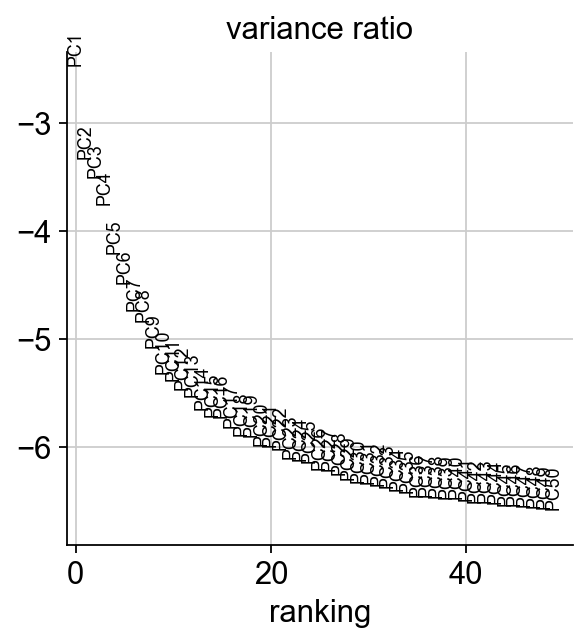

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


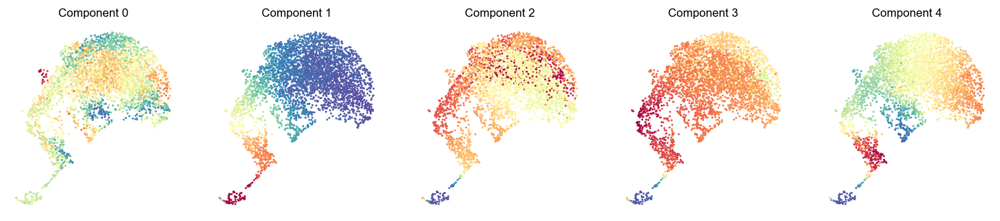

Selected early cell (recomputed PCA, HOXKO): TATGTTCAGATGCGAC-1
Sampling and flocking waypoints...
Time for determining waypoints: 0.0027612765630086263 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.03098908265431722 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9997
Correlation at iteration 2: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


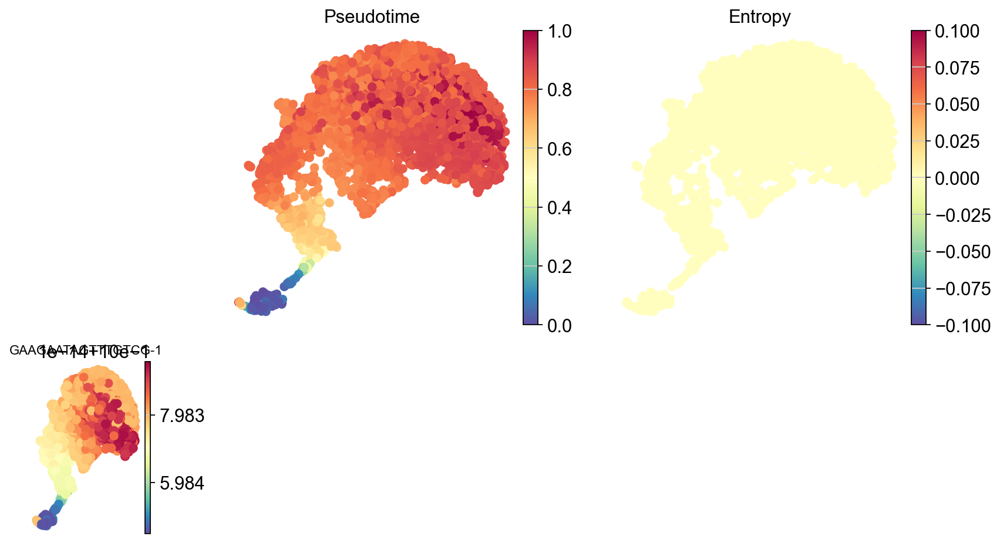

['GAAGAATAGTTTGTCG-1']
GAAGAATAGTTTGTCG-1    Head_Mesoderm
Name: annotation_short, dtype: category
Categories (5, object): ['NMP', 'pPSM', 'aPSM', 'Somite', 'Head_Mesoderm']


<Figure size 800x400 with 0 Axes>

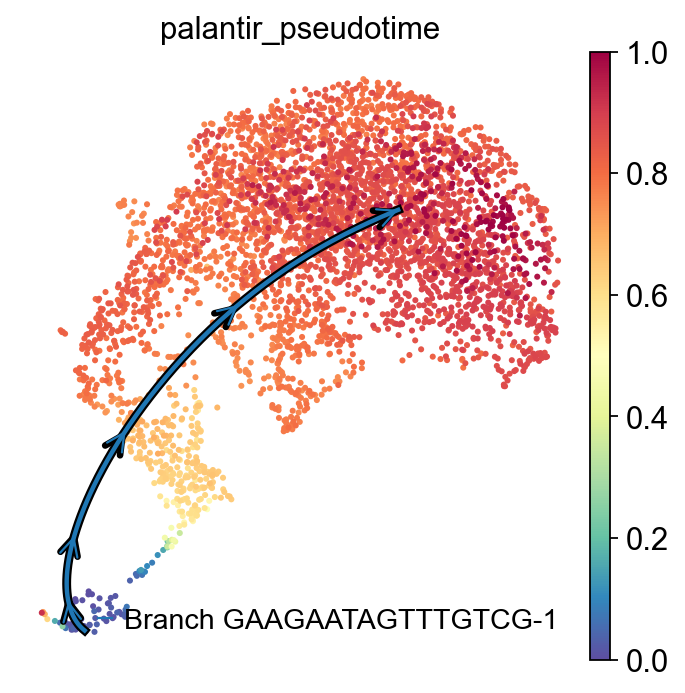

In [16]:
# Recomputed-PCA version — HOXKO
HOXKO_adata_subset_recomp = HOXKO_adata_subset.copy()

# recompute HVGs within just this lineage
sc.pp.highly_variable_genes(HOXKO_adata_subset_recomp, min_mean=0.0125, max_mean=3, min_disp=0.5)
print(f"HVGs found in subset: {HOXKO_adata_subset_recomp.var['highly_variable'].sum()}")

# fresh PCA restricted to this lineage only
sc.tl.pca(HOXKO_adata_subset_recomp, svd_solver='arpack')
sc.pl.pca_variance_ratio(HOXKO_adata_subset_recomp, log=True, n_pcs=50)

# Diffusion maps on the recomputed PCA
n_diffusion_components = 5
HOXKO_dm_res_recomp = palantir.utils.run_diffusion_maps(HOXKO_adata_subset_recomp, n_components=n_diffusion_components)
HOXKO_ms_data_recomp = palantir.utils.determine_multiscale_space(HOXKO_adata_subset_recomp)

palantir.plot.plot_diffusion_components(HOXKO_adata_subset_recomp)
plt.show()

# Derive early_cell based on the co-expression of SOX2 and TBXT in NMPs
nmp_mask_recomp_hoxko = HOXKO_adata_subset_recomp.obs["annotation_short"] == "NMP"
nmp_subset_recomp_hoxko = HOXKO_adata_subset_recomp.raw.to_adata()[nmp_mask_recomp_hoxko]

sox2_expr_recomp_hoxko = nmp_subset_recomp_hoxko[:, "SOX2"].X.toarray().flatten()
tbxt_expr_recomp_hoxko = nmp_subset_recomp_hoxko[:, "TBXT"].X.toarray().flatten()
coexpr_score_recomp_hoxko = sox2_expr_recomp_hoxko * tbxt_expr_recomp_hoxko

early_cell_recomp_hoxko = nmp_subset_recomp_hoxko.obs_names[np.argmax(coexpr_score_recomp_hoxko)]
print(f"Selected early cell (recomputed PCA, HOXKO): {early_cell_recomp_hoxko}")

# Run Palantir
pr_res_recomp_hoxko = palantir.core.run_palantir(
    HOXKO_adata_subset_recomp,
    early_cell=early_cell_recomp_hoxko,
    num_waypoints=500,
)

palantir.plot.plot_palantir_results(HOXKO_adata_subset_recomp)
plt.show()

# Terminal state check
terminal_cells_recomp_hoxko = pr_res_recomp_hoxko.branch_probs.columns.tolist()
print(terminal_cells_recomp_hoxko)
print(HOXKO_adata_subset_recomp.obs.loc[terminal_cells_recomp_hoxko, 'annotation_short'])

# Violin plot — pseudotime by cluster
sc.pl.violin(
    HOXKO_adata_subset_recomp,
    "palantir_pseudotime",
    groupby="annotation_short",
    rotation=45,
    show=False,
    save="20260805_HOXKO_Recomp_Palantir_Violin.pdf"
)
plt.gcf().set_size_inches(10, 5)
plt.tight_layout()
plt.show()

# Plot the trajectory in the UMAP
masks = palantir.presults.select_branch_cells(HOXKO_adata_subset_recomp, q=.01, eps=.01)

palantir.plot.plot_trajectories(HOXKO_adata_subset_recomp, pseudotime_interval=(0, 0.9))
plt.savefig("figures/20260805_HOXKO_Recomp_Palantir_trajectory_paths.pdf", bbox_inches="tight")
plt.show()

## PART 3 - Merged analysis

Here we want to see where the previously annotated clusters for WT and HOXKO samples fall into the merged dataset before integration with Harmony

In [17]:
adata =sc.read_h5ad("D:/BIOINFO/POURQUIE/HOX_project/Analysis_SCANPY/H5AD/20241113_HOXsamples_all_qc_filtered_dr.h5ad")

In [18]:
adata.obs['barcode_suffix'] = adata.obs_names.str.extract(r'(-\d+)$')[0].values
print(adata.obs.groupby('sample')['barcode_suffix'].value_counts())

C:\Users\aleja\AppData\Local\Temp\ipykernel_9300\301157723.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(adata.obs.groupby('sample')['barcode_suffix'].value_counts())


sample     barcode_suffix
HOXBCD_KO  -0                2535
           -1                   0
           -2                   0
           -3                   0
           -4                   0
HOXCD_KO   -1                2284
           -0                   0
           -2                   0
           -3                   0
           -4                   0
HOXD_KO    -2                3133
           -0                   0
           -1                   0
           -3                   0
           -4                   0
HOX_KO     -3                4124
           -0                   0
           -1                   0
           -2                   0
           -4                   0
WT         -4                5564
           -0                   0
           -1                   0
           -2                   0
           -3                   0
Name: count, dtype: int64


C:\Users\aleja\AppData\Local\Temp\ipykernel_9300\953613128.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(adata.obs.groupby('sample')['original_annotation'].apply(lambda x: x.isna().sum()))


sample
HOXBCD_KO    2535
HOXCD_KO     2284
HOXD_KO      3133
HOX_KO          0
WT              0
Name: original_annotation, dtype: int64


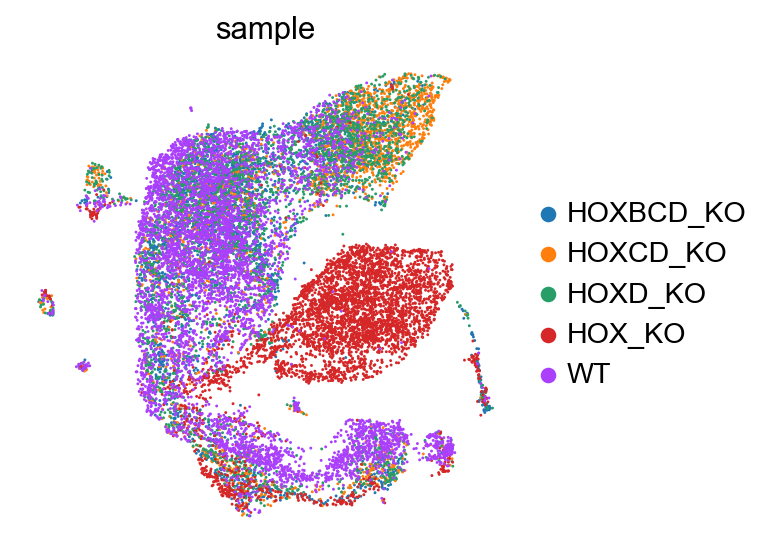

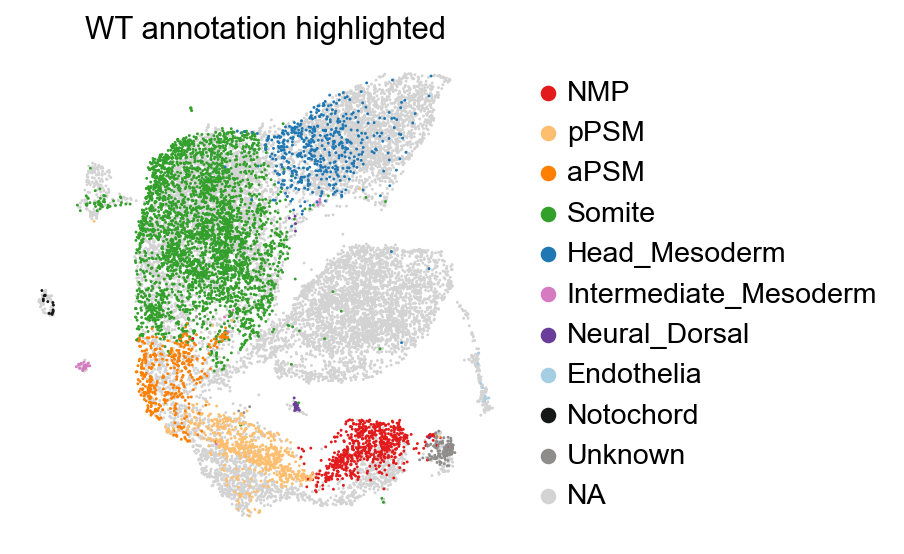

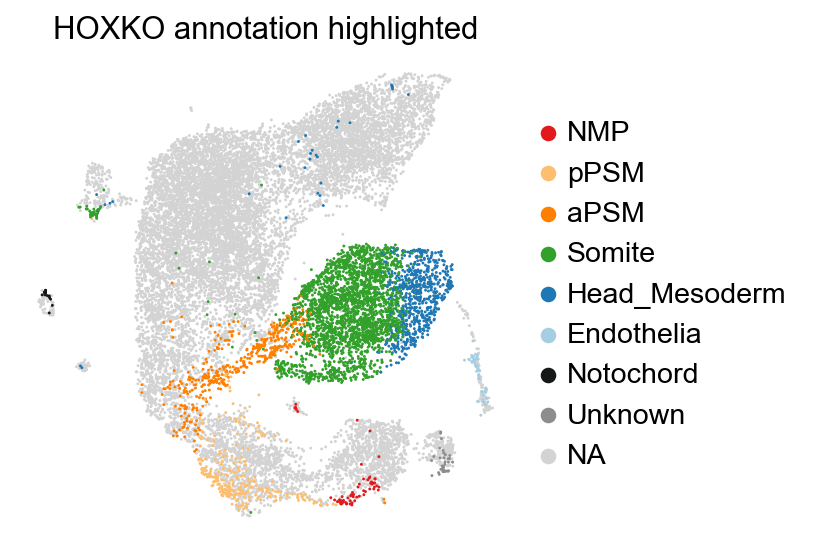

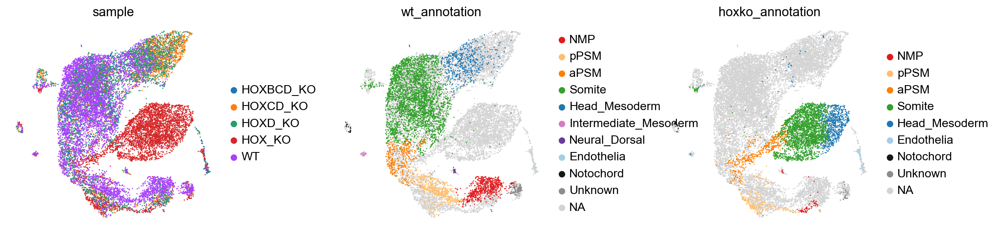

In [19]:
wt_annot = WT_adata_fused.obs['annotation_short'].copy()
wt_annot.index = wt_annot.index + '-4'

hoxko_annot = HOXKO_adata_fused.obs['annotation_short'].copy()
hoxko_annot.index = hoxko_annot.index + '-3'

orig_annot = pd.concat([wt_annot, hoxko_annot])

adata.obs['original_annotation'] = adata.obs_names.map(orig_annot)

print(adata.obs.groupby('sample')['original_annotation'].apply(lambda x: x.isna().sum()))

wt_color_map = dict(zip(
    WT_adata_fused.obs['annotation_short'].cat.categories,
    custom_colors
))
hoxko_color_map = dict(zip(
    HOXKO_adata_fused.obs['annotation_short'].cat.categories,
    custom_colors2
))


wt_categories = WT_adata_fused.obs['annotation_short'].cat.categories.tolist()

adata.obs['wt_annotation'] = adata.obs['original_annotation'].where(
    adata.obs['sample'] == 'WT'
).astype(pd.CategoricalDtype(categories=wt_categories))

# build the color list from the CURRENT categories, in their CURRENT order,
# looked up by name — not by position
adata.uns['wt_annotation_colors'] = [
    wt_color_map[cat] for cat in adata.obs['wt_annotation'].cat.categories
]

sc.pl.umap(
    adata,
    color='sample',
    frameon=False,
    save="20260805_HOXsamples_RegressedScaledDataset_bySample.pdf"
)


sc.pl.umap(
    adata,
    color='wt_annotation',
    na_color='lightgrey',
    frameon=False,
    title='WT annotation highlighted',
    save="20260805_WT_clustering_inRegressedScaledDataset.pdf"
)

hoxko_categories = HOXKO_adata_fused.obs['annotation_short'].cat.categories.tolist()

adata.obs['hoxko_annotation'] = adata.obs['original_annotation'].where(
    adata.obs['sample'] == 'HOX_KO'
).astype(pd.CategoricalDtype(categories=hoxko_categories))

adata.uns['hoxko_annotation_colors'] = [
    hoxko_color_map[cat] for cat in adata.obs['hoxko_annotation'].cat.categories
]

sc.pl.umap(
    adata,
    color='hoxko_annotation',
    na_color='lightgrey',
    frameon=False,
    title='HOXKO annotation highlighted',
    save="20260805_HOXKO_clustering_inRegressedScaledDataset.pdf"
)

sc.pl.umap(
    adata,
    color=['sample', 'wt_annotation', 'hoxko_annotation'],
    wspace=0.4,
    frameon=False,
)

## Part 4 - Additional plots requested in the Integrated Dataset

In [20]:
adata_int = sc.read_h5ad("D:/BIOINFO/POURQUIE/HOX_project/Analysis_SCANPY/H5AD/20241113_HOXsamples_all_qc_filtered_dr_Harmony_clustered_anno.h5ad")

In [21]:
# check that the matrix looks like normalized counts
print(adata_int.X[1:10,1:10])

  (0, 6)	0.547740638256073
  (3, 4)	0.33367305994033813
  (8, 4)	0.2874073386192322
  (8, 6)	0.510386049747467


In [22]:
print(adata_int.raw.X[1:10,1:10]) 

  (0, 6)	0.547740638256073
  (3, 4)	0.33367305994033813
  (8, 4)	0.2874073386192322
  (8, 6)	0.510386049747467


In [23]:
genes  = ["NKX1-2","SOX2","CDX2","CDX4", "TBXT",  # NMP
          "TBX6","MSGN1","HES7","MESP1","MESP2","MEOX1","RIPPLY1","FOXC2","MEOX2","ALDH1A2", 'PAX3','TCF15',"SIX1","EYA1","EYA2",  #Mesoderm
          "FOXA2", "NOTO","SHH",  #notochord
          "PAX6","MAP2", #dorsal neural
          "JAG1","PAX8","PAX2",  "GDNF", #nephric
          "TBX1","TWIST1","TCF21", # anteriorParaxialMesoderm
          "KDR","SOX17", "CD34"  # endothelial
         ]

Before fusing Somite clusters:

WT


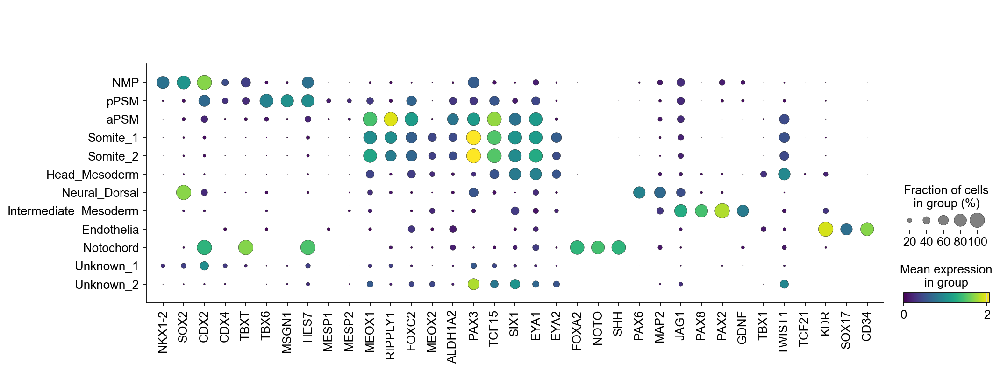

HOXD_KO


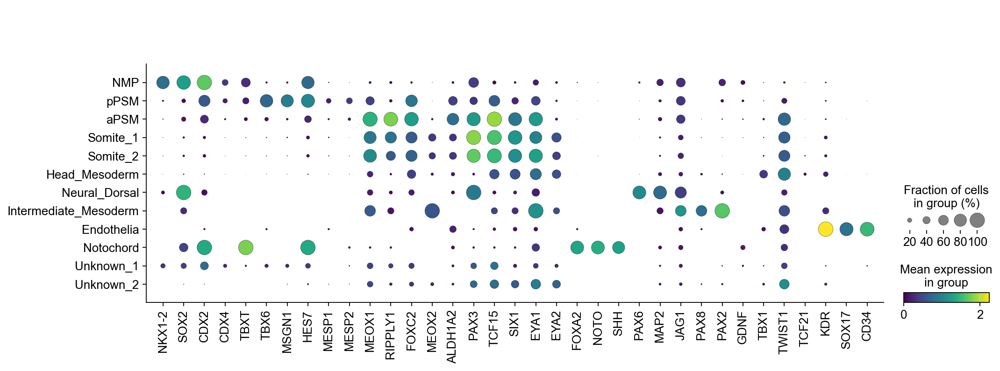

HOXBCD_KO


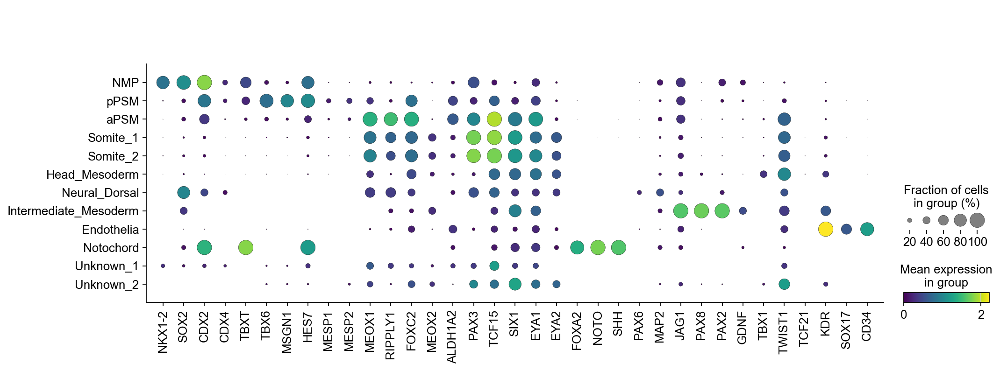

HOXCD_KO


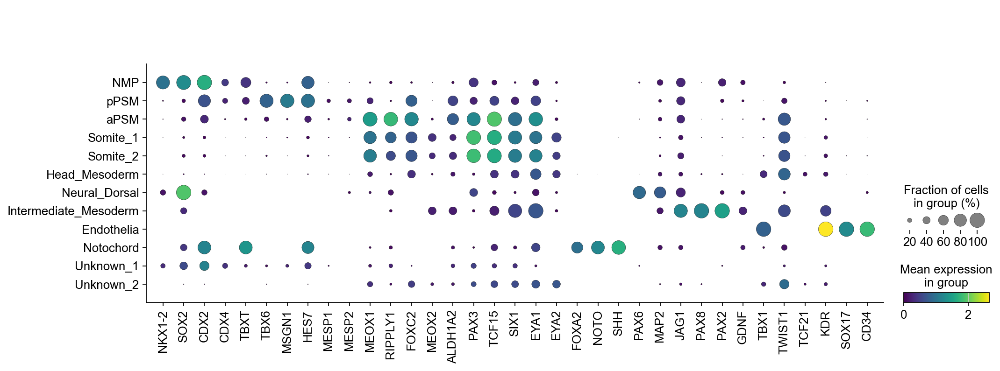

HOX_KO


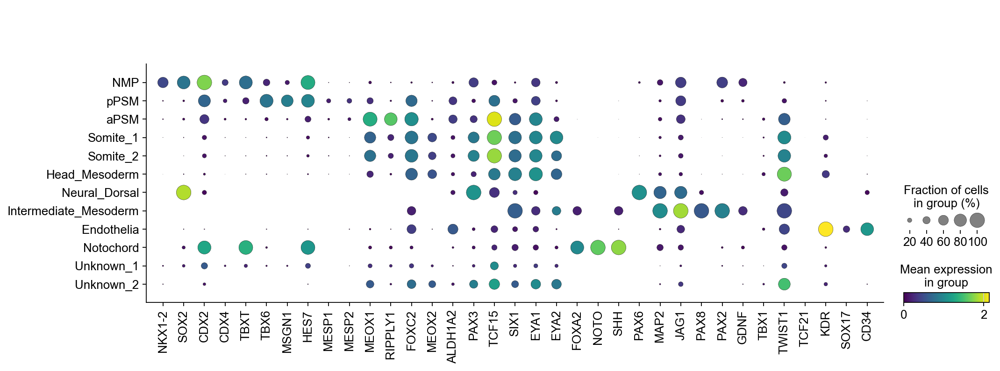

In [24]:
# Loop through each sample and plot a dot plot for the gene cluster
for i in ['WT', 'HOXD_KO', 'HOXBCD_KO', 'HOXCD_KO', 'HOX_KO']:
    print(i)
    sc.pl.dotplot(
        adata_int[adata_int.obs["sample"] == i],  # Subset the data for each sample
        var_names= genes,           # Genes in the cluster
        groupby="annotation",             # Group by annotation
        color_map="viridis",             # Choose a color map
        save=f'20260805_HOXsamples_Integrated_dotplot_Marker_genes_{i}_allclusters.pdf'
    )

As somite clusters 1 and 2 have very similar profile we can fuse them for easier interpretation

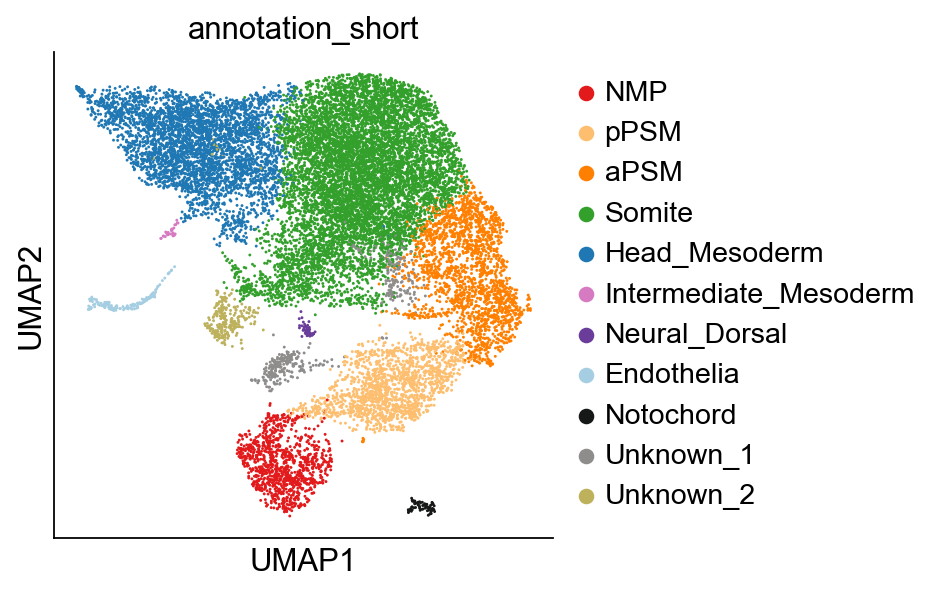

In [25]:
adata_int.obs['annotation_short'] = (
    adata_int.obs["annotation"]
    .map(lambda x: {"Somite_1": "Somite", "Somite_2": "Somite"}.get(x, x))
    .astype("category")
)

adata_int.obs['annotation_short'] = adata_int.obs['annotation_short'].cat.reorder_categories(['NMP','pPSM','aPSM','Somite',
                     'Head_Mesoderm','Intermediate_Mesoderm','Neural_Dorsal','Endothelia','Notochord', 'Unknown_1','Unknown_2' ])

custom_colors3 = [
    '#e31a1c', '#fdbf6f', '#ff7f00',
    '#33a02c','#1f78b4', '#d67ac1', '#6a3d9a', 
    '#a6cee3', '#161717', '#8f8d8c','#bdb15c' 
]

# Assign the custom colors
adata_int.uns["annotation_short_colors"] = custom_colors3

# Plot the UMAP with custom colors
sc.pl.umap(adata_int, color="annotation_short",save="20260805_Integrated_HOXallsamples_UMAP_annotated_Somitefusedclusters.pdf")

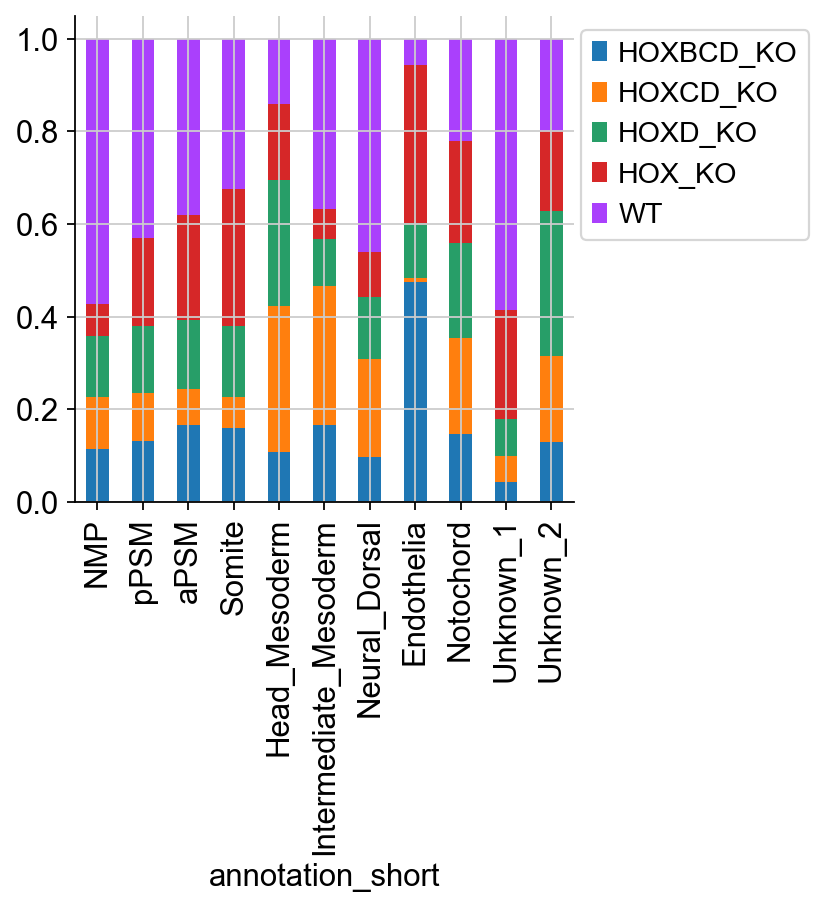

In [26]:
tmp = pd.crosstab(adata_int.obs['annotation_short'],adata_int.obs['sample'], normalize='index')
tmp.plot.bar(stacked=True).legend(loc='upper right',bbox_to_anchor=(1.5,1))
plt.savefig('figures/20280805_HOXsamples_proportion_allclusters_SomiteFusedClusters.pdf', format='pdf', dpi=300, bbox_inches='tight')

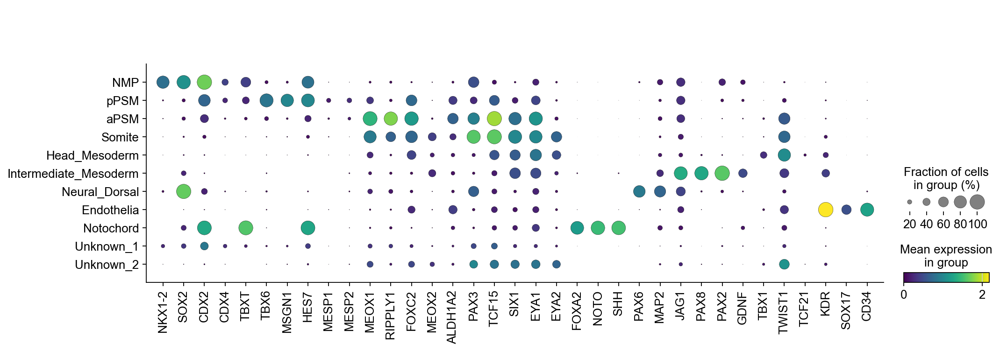

In [27]:
sc.pl.dotplot(adata_int, genes, color_map="viridis", groupby='annotation_short', save="20260805_HOXsamples_Integrated_dotplot_Marker_genes_Somitefusedclusters.pdf")

Also plot per individual genotype

WT


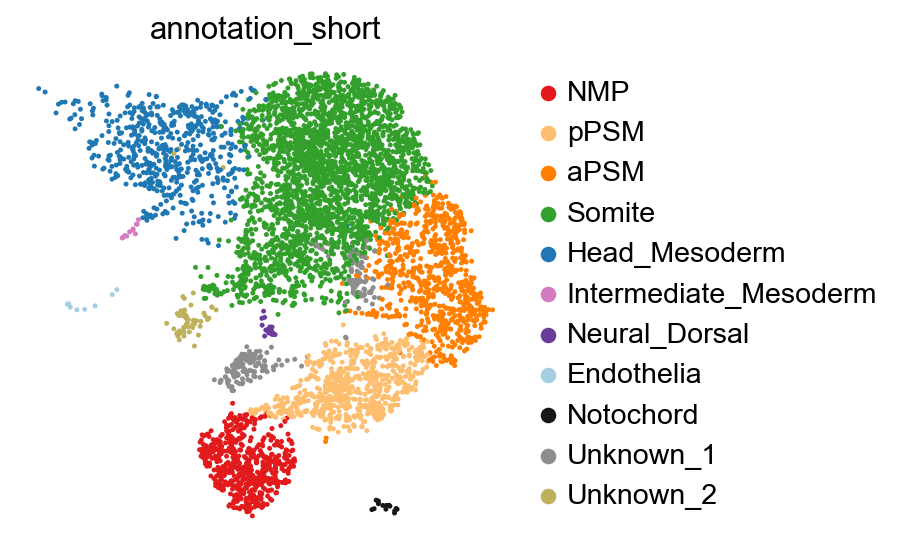

HOXD_KO


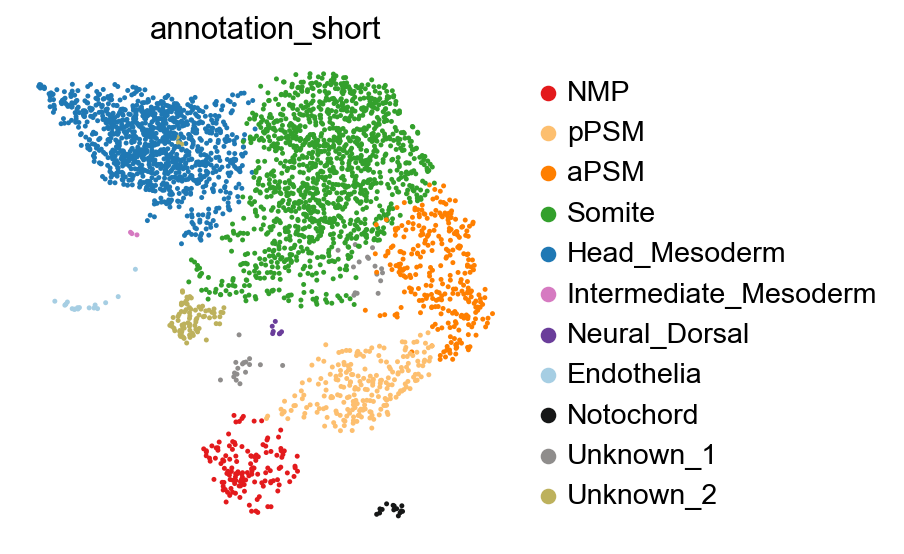

HOXBCD_KO


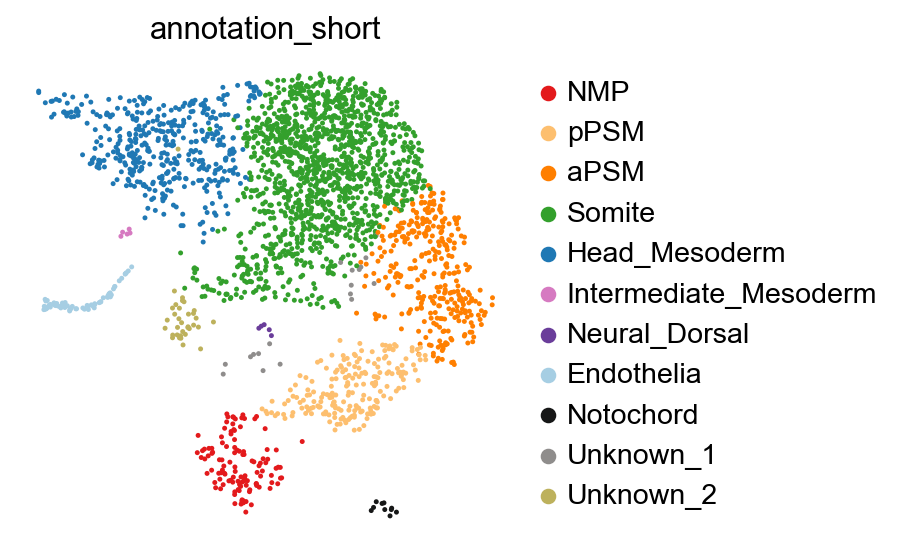

HOXCD_KO


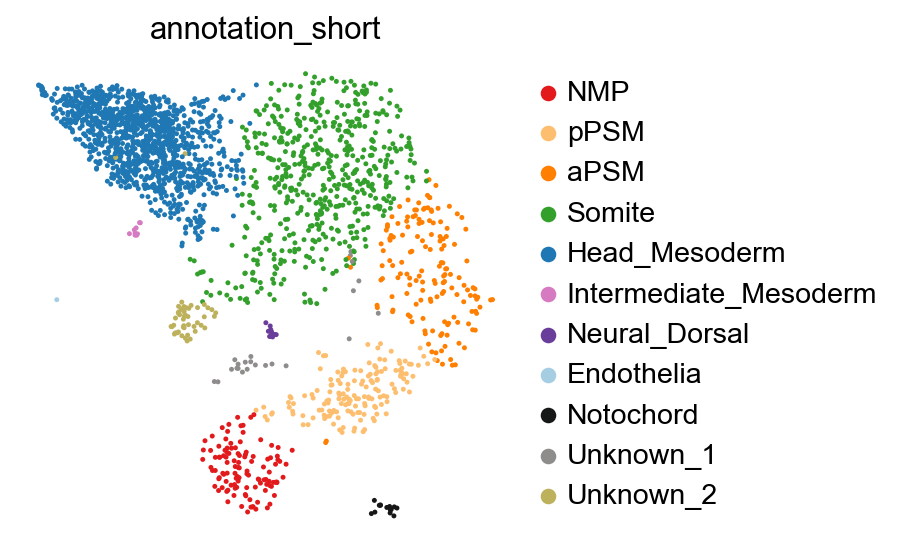

HOX_KO


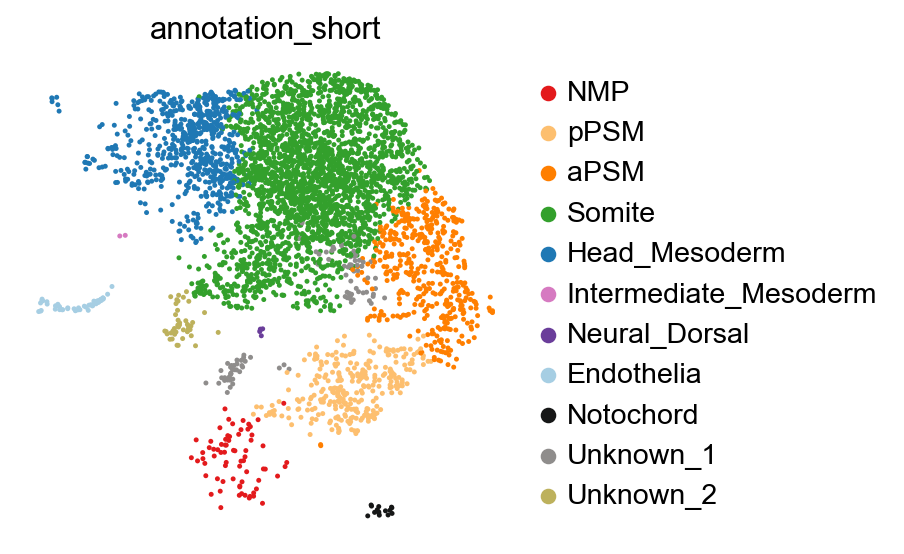

In [28]:
for i in ['WT', 'HOXD_KO','HOXBCD_KO','HOXCD_KO','HOX_KO']:
    print(i)
    sc.pl.umap(
    adata_int[adata_int.obs["sample"] == i], size=20,
    color=["annotation_short"],
    frameon=False,
    save=f'20260805_UMAP_annotation_integrated_Somitefusedclusters_{i}.pdf'
    )

WT


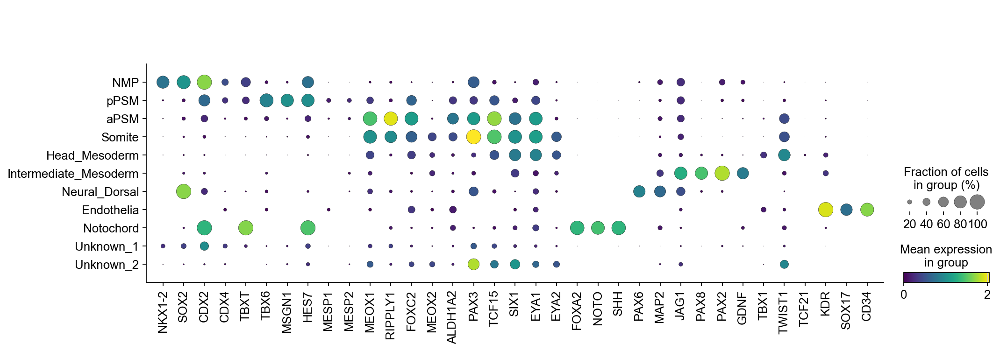

HOXD_KO


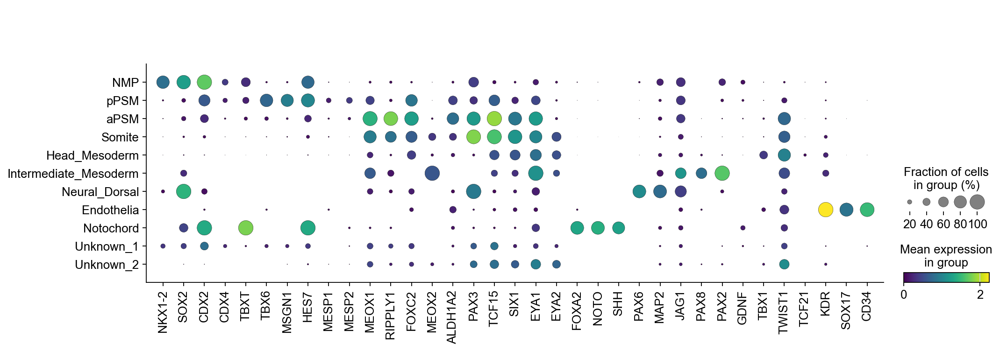

HOXBCD_KO


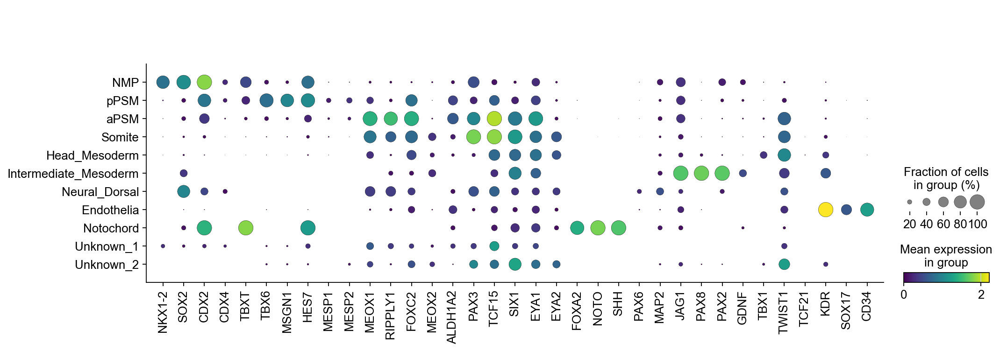

HOXCD_KO


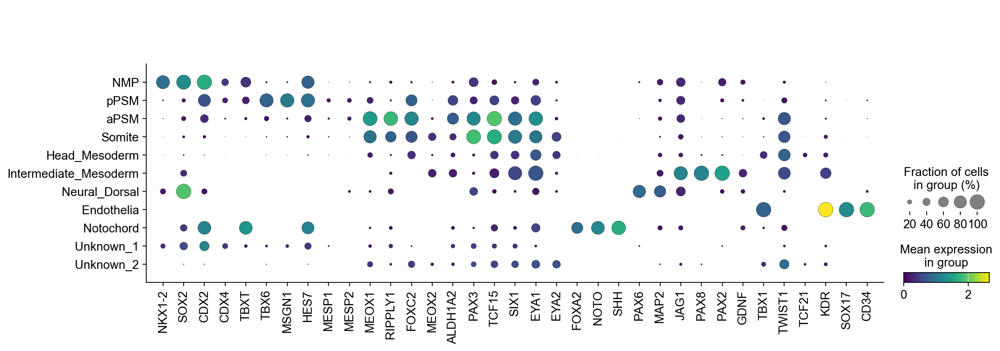

HOX_KO


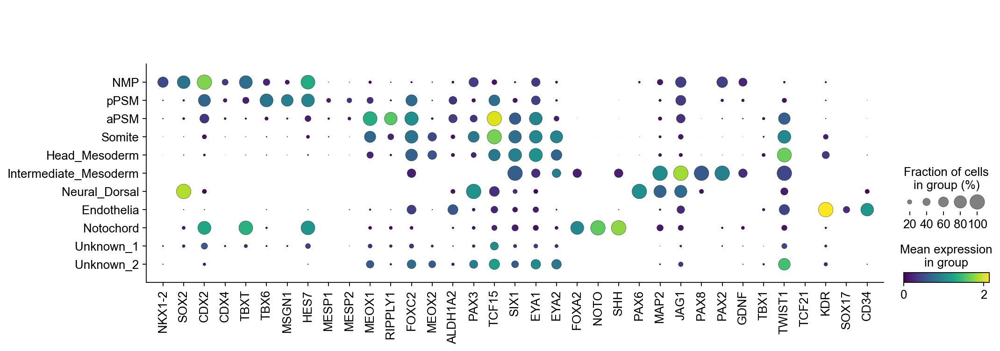

In [29]:
# Loop through each sample and plot a dot plot for the gene cluster
for i in ['WT', 'HOXD_KO', 'HOXBCD_KO', 'HOXCD_KO', 'HOX_KO']:
    print(i)
    sc.pl.dotplot(
        adata_int[adata_int.obs["sample"] == i],  # Subset the data for each sample
        var_names= genes,           # Genes in the cluster
        groupby="annotation_short",             # Group by annotation
        color_map="viridis",             # Choose a color map
        save=f'20260805_HOXsamples_Integrated_dotplot_Marker_genes_{i}_Somitefusedclusters.pdf'
    )

In [30]:
hox_genes= ["HOXA1","HOXA2", "HOXA3", "HOXA4", "HOXA5","HOXA6","HOXA7","HOXA9", "HOXA10", "HOXA13", #'HOXA8', "HOXA11","HOXA12" not expressed
            "HOXB1","HOXB2", "HOXB3", "HOXB4", "HOXB5","HOXB6","HOXB7","HOXB8", "HOXB9", "HOXB13",  # "HOXB10","HOXB11","HOXB12" not expressed
            "HOXC4", "HOXC5","HOXC6", "HOXC8", "HOXC9","HOXC10",'HOXC13', # 'HOXC1','HOXC2', 'HOXC3',  'HOXC7', 'HOXC11', 'HOXC12' not expressed
            "HOXD1", "HOXD3", "HOXD4", "HOXD8", "HOXD9","HOXD13" # 'HOXD2', 'HOXD5', 'HOXD6', 'HOXD7', 'HOXD10', 'HOXD11', 'HOXD12', not expressed
           ]

WT


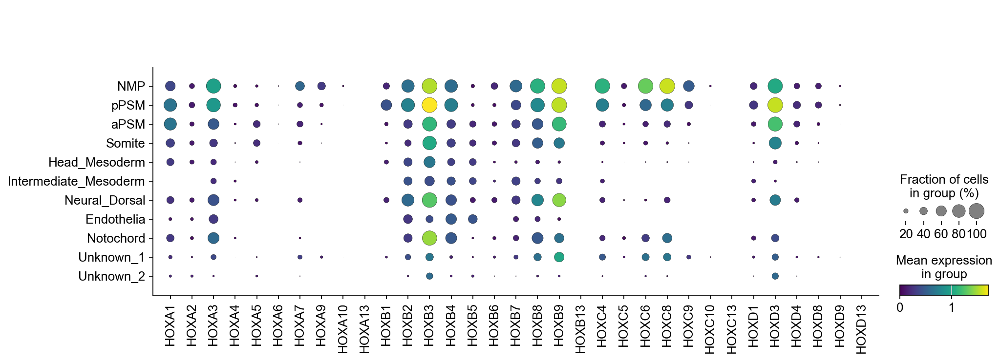

HOXD_KO


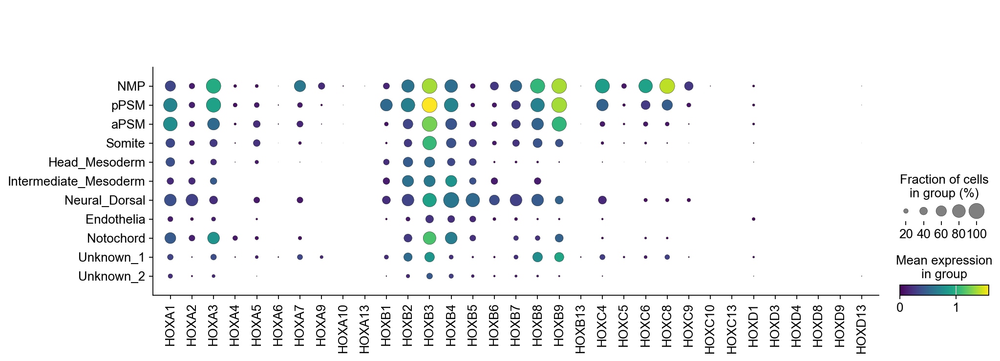

HOXBCD_KO


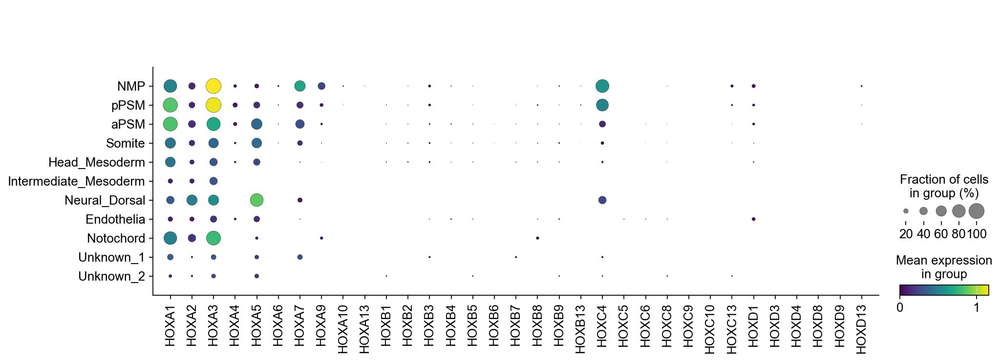

HOXCD_KO


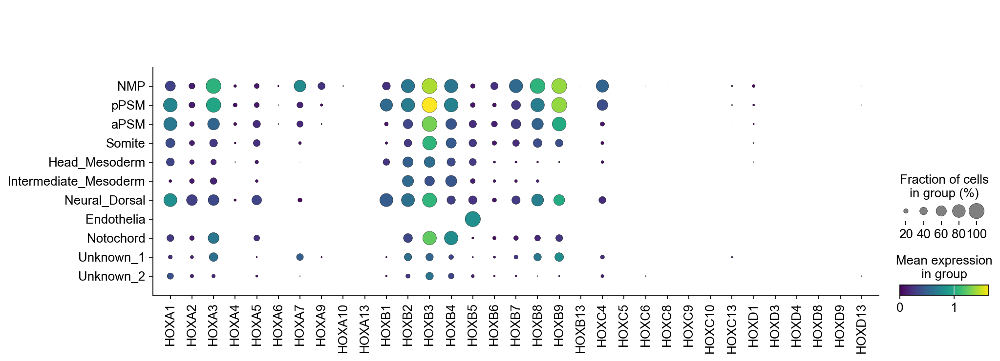

HOX_KO


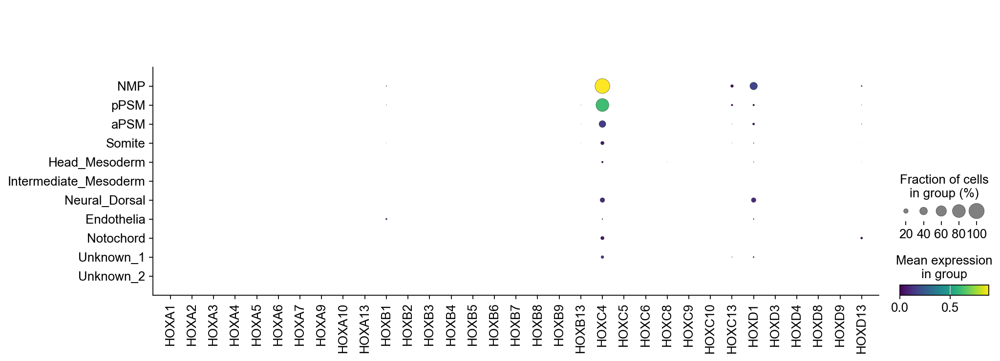

In [31]:
# Loop through each sample and plot a dot plot for the gene cluster
for i in ['WT', 'HOXD_KO', 'HOXBCD_KO', 'HOXCD_KO', 'HOX_KO']:
    print(i)
    sc.pl.dotplot(
        adata_int[adata_int.obs["sample"] == i],  # Subset the data for each sample
        var_names= hox_genes,           # Genes in the cluster
        groupby="annotation_short",             # Group by annotation
        color_map="viridis",             # Choose a color map
        save=f'20260805_HOXsamples_Integrated_dotplot_HOX_genes_orderedbycluster_{i}_Somitefusedclusters.pdf'
    )